#07: PyTorch Experiment Tracking
> **Note:** This notebook uses `torchvision`'s new [multi-weight support API (available in `torchvision` v0.13+)](https://pytorch.org/blog/introducing-torchvision-new-multi-weight-support-api/).

We've trained a fair few models now on the journey to making FoodVision Mini (an image classification model to classify images of pizza, steak or sushi).

And so far we've keep track of them via Python dictionaries.

Or just comparing them by the metric print outs during training.

What if you wanted to run a dozen (or more) different models at once?

Surely there's a better way...

There is.

**Experiment tracking.**

And since experiment tracking is so important and integral to machine learning, you can consider this notebook your first milestone project.

So welcome to Milestone Project 1: FoodVision Mini Experiment Tracking.

We're going to answer the question: **how do I track my machine learning experiments?**

In [3]:
import torch
import torchvision

print(torch.__version__)
print(torchvision.__version__)

2.3.1+cu121
0.18.1+cu121


In [4]:
# Continue with regular imports
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms

# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Try to import the going_modular directory, download it from GitHub if it doesn't work
try:
    from going_modular.going_modular import data_setup, engine
except:
    # Get the going_modular scripts
    print("[INFO] Couldn't find going_modular scripts... downloading them from GitHub.")
    !git clone https://github.com/mrdbourke/pytorch-deep-learning
    !mv pytorch-deep-learning/going_modular .
    !rm -rf pytorch-deep-learning
    from going_modular.going_modular import data_setup, engine

[INFO] Couldn't find torchinfo... installing it.
[INFO] Couldn't find going_modular scripts... downloading them from GitHub.
Cloning into 'pytorch-deep-learning'...
remote: Enumerating objects: 4056, done.
remote: Total 4056 (delta 0), reused 0 (delta 0), pack-reused 4056
Receiving objects: 100% (4056/4056), 646.90 MiB | 15.73 MiB/s, done.
Resolving deltas: 100% (2372/2372), done.
Updating files: 100% (248/248), done.


In [5]:
# Setup device agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [6]:
# Set seeds
def set_seeds(seed: int=42):
    """Sets random sets for torch operations

    Args:
    seed (int, optional): Random seed to set, Defaults to 42
    """
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

In [7]:
set_seeds()

## 1. Getting data

Want to get pizza steak sushi images.

so we can run experiments building FoodVisionMini.

In [8]:
import os
import zipfile

from pathlib import Path
import requests
def download_data(source:str,
                  destination:str,
                  remove_source:bool=True) -> Path:
    """Downloads a zipped dataset from source and unzips at desstination"""
    # Setup the path to data folder
    data_path = Path("data/")
    image_path = data_path / destination

    if image_path.is_dir():
        print("[INFO] image_path directory already exists...")
    else:
        print("[INFO] did not find image_path, Creating one...")
        image_path.mkdir(parents=True, exist_ok=True)

        target_file = Path(source).name
        with open(data_path/target_file, "wb") as f :
            request = requests.get(source)
            print(f"[INFO] Downloading {target_file} from {source}")
            f.write(request.content)
        with zipfile.ZipFile(data_path/target_file, "r") as zip_ref:
            print(f"[INFO] unzipping {target_file}...")
            zip_ref.extractall(image_path)
        if remove_source:
            os.remove(data_path / target_file)
        return image_path

In [9]:
image_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                           destination="pizza_steak_sushi")

[INFO] did not find image_path, Creating one...
[INFO] Downloading pizza_steak_sushi.zip from https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip
[INFO] unzipping pizza_steak_sushi.zip...


## 2. Creating Datasets and DataLoaders



### 2.1 Create DataLoaders with manual transforms

The goal with transforms is to ensure your custom data is formatted in a reproducible way as well as a way that will suit pretrained models.

In [10]:
# Creating DataLoaders Using Manual Ways
"""images_path = Path("data/") / "pizza_steak_sushi"
train_dir = images_path / "train"
test_dir = images_path / "test"
import os
BATCH_SIZE = 32
NUM_WORKERS = os.cpu_count()
manual_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTesnsor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225])
])
from going_modular.going_modular import data_setup
train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir,
                                                                               test_dir=test_dir,
                                                                               transform=manual_transform,
                                                                               batch_size= BATCH_SIZE,
                                                                               num_workers=NUM_WORKERS)"""
#_______________________________________________________________________________________________________________

'images_path = Path("data/") / "pizza_steak_sushi"\ntrain_dir = images_path / "train"\ntest_dir = images_path / "test"\nimport os\nBATCH_SIZE = 32\nNUM_WORKERS = os.cpu_count()\nmanual_transform = transforms.Compose([\n    transforms.Resize((224, 224)),\n    transforms.ToTesnsor(),\n    transforms.Normalize(mean=[0.485, 0.456, 0.406],\n                        std=[0.229, 0.224, 0.225])\n])\nfrom going_modular.going_modular import data_setup\ntrain_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir,\n                                                                               test_dir=test_dir,\n                                                                               transform=manual_transform,\n                                                                               batch_size= BATCH_SIZE,\n                                                                               num_workers=NUM_WORKERS)'

### 2.2 Create DataLoaders using automatically created transforms

The same principle applies for automatic transforms: we want our custom data in the same format as a pretrained model was trained on.

In [11]:
from torchvision import models
from pathlib import Path
images_path = Path("data/") / "pizza_steak_sushi"
train_dir = images_path / "train"
test_dir = images_path / "test"

weights = models.EfficientNet_B0_Weights.DEFAULT
transform = weights.transforms()
model = models.efficientnet_b0(weights=weights).to(device)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 141MB/s]


In [12]:
from torch.utils.data import DataLoader
import os
BATCH_SIZE = 32
NUM_WORKERS = os.cpu_count()

# Create dataloaders Using going_modular/data_setup.py
from going_modular.going_modular import data_setup
train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir,
                                                                               test_dir=test_dir,
                                                                               transform=transform,
                                                                               batch_size=BATCH_SIZE,
                                                                               num_workers=NUM_WORKERS)
train_dataloader, test_dataloader, class_names

(<torch.utils.data.dataloader.DataLoader at 0x7dea6b108460>,
 ['pizza', 'steak', 'sushi'])

## 3. Getting a pretrained model, freeze the base layers and change the classifier head.

In [13]:
weights = models.EfficientNet_B0_Weights.DEFAULT
model = models.efficientnet_b0(weights=weights).to(device)

In [14]:
summary(model=model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   True
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   864                  True
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   64                   True
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 16, 112

In [15]:
model.classifier

Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=1000, bias=True)
)

In [16]:
# Freeze our base layers by setting their requires_grad attribute to False
from torch import nn
for param in model.features.parameters():
    param.requires_grad = False
set_seeds()
model.classifier = nn.Sequential(
    torch.nn.Dropout(p=0.2, inplace=True),
    torch.nn.Linear(in_features=1280,
                    out_features=len(class_names),
                    bias=True)).to(device)

In [17]:
model.classifier

Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=3, bias=True)
)

In [18]:
summary(model=model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

## 4. Train a single model and track results

In [19]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

### To interact with `TensorBoard` we can use PyTorch's SummaryWriter - https://pytorch.org/docs/stable/tensorboard.html#torch.utils.tensorboard.writer.SummaryWriter

In [20]:
# SetuP a SummaryWriter
import torch
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

In [21]:
writer

In [22]:
import torch
from tqdm.auto import tqdm
from typing import Dict, List, Tuple
from going_modular.going_modular.engine import train_step, test_step

def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device,
          writer:torch.utils.tensorboard.writer.SummaryWriter
          ) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Args:
    model: A PyTorch model to be trained and tested.
    train_dataloader: A DataLoader instance for the model to be trained on.
    test_dataloader: A DataLoader instance for the model to be tested on.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    loss_fn: A PyTorch loss function to calculate loss on both datasets.
    epochs: An integer indicating how many epochs to train for.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A dictionary of training and testing loss as well as training and
    testing accuracy metrics. Each metric has a value in a list for
    each epoch.
    In the form: {train_loss: [...],
              train_acc: [...],
              test_loss: [...],
              test_acc: [...]}
    For example if training for epochs=2:
             {train_loss: [2.0616, 1.0537],
              train_acc: [0.3945, 0.3945],
              test_loss: [1.2641, 1.5706],
              test_acc: [0.3400, 0.2973]}
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }

    # Make sure model on target device
    model.to(device)

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)
        if writer:
            ### New : Experiment Tracking: ###
            writer.add_scalars(main_tag="Loss",
                            tag_scalar_dict={"train_loss":train_loss,
                                             "test_loss":test_loss},
                            global_step=epoch)
            writer.add_scalars(main_tag="Accuracy",
                            tag_scalar_dict={"train_acc":train_acc,
                                            "test_acc":test_acc},
                            global_step=epoch)
            writer.add_graph(model=model,
                            input_to_model=torch.randn(32, 3, 224, 224).to(device))
            # Close the Writer
            writer.close()
            ### End New ###
        else:
            pass

    # Return the filled results at the end of the epochs
    return results

In [23]:
# Train the model With our updated train function
# Note : Not using engine.train(), since we have updated the train() function above
set_seeds()
# results = train(model=model,
                # train_dataloader=train_dataloader,
                # test_dataloader=test_dataloader,
                # optimizer=optimizer,
                # loss_fn=loss_fn,
                # epochs=5,
                # device=device)

## 5. View our models results with TensorBoard

There are a few ways to see our experiments, see them here - https://www.learnpytorch.io/07_pytorch_experiment_tracking/#5-view-our-models-results-in-tensorboard

In [24]:
# Let's View our experiments from within the notebook
"""%load_ext tensorboard
%tensorboard --logdir runs
!kill 1708"""

'%load_ext tensorboard\n%tensorboard --logdir runs\n!kill 1708'

## 6. Create a function to prepare a `SummaryWriter()` instance

By Default our `SummaryWriter()` class saves to `log_dir`.

How about if we wanted to save different experiments in different folders.
in essence, one experiment = one folder.

For example, we'd like to track:
* Experiment date/timestamp
* Experiment name
* Model name
* Extra - is there anything else that should be tracked ?

Let's create a function to create a `SummaryWriter()` instance to take all of these things into account.

So ideally we end up tracking experiments to a directory:

`runs/YYYY-MM-DD/experiment_name/model_name/extra`

In [25]:
from torch.utils.tensorboard import SummaryWriter
def create_writer(experiment_name:str,
                  model_name:str,
                  extra:str=None):
    """ Creates a torch.utils.tensorboard.writer.SummaryWriter() instance tracking to a specific directory """
    from datetime import datetime
    import os

    # Get timestamp of currrent date in reverse order
    timestamp = datetime.now().strftime('%y-%m-%d')

    if extra:
        log_dir = os.path.join("runs", timestamp, experiment_name, model_name, extra)
    else:
        log_dir = os.path.join("runs", timestamp, experiment_name, model_name)
    print(f"[INFO] Created SummaryWriter, Saving to {log_dir}")
    return SummaryWriter(log_dir=log_dir)

In [26]:
example_writer = create_writer(experiment_name="data_10_percent",
                               model_name = "effneetb0",
                               extra="5_epochs")
example_writer

[INFO] Created SummaryWriter, Saving to runs/24-07-25/data_10_percent/effneetb0/5_epochs


### 6.1 Update the `train()` function to include a `writer` parameter

In [27]:
# Update train() To use create_writer....
results = train(model=model,
                train_dataloader=train_dataloader,
                test_dataloader=test_dataloader,
                optimizer=optimizer,
                loss_fn=loss_fn,
                epochs=5,
                device=device,
                writer=example_writer)

  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch: 1 | train_loss: 1.0924 | train_acc: 0.3984 | test_loss: 0.9133 | test_acc: 0.5398
Epoch: 2 | train_loss: 0.8975 | train_acc: 0.6562 | test_loss: 0.7837 | test_acc: 0.8561
Epoch: 3 | train_loss: 0.8038 | train_acc: 0.7461 | test_loss: 0.6723 | test_acc: 0.8864
Epoch: 4 | train_loss: 0.6770 | train_acc: 0.8516 | test_loss: 0.6699 | test_acc: 0.8049
Epoch: 5 | train_loss: 0.7065 | train_acc: 0.7188 | test_loss: 0.6746 | test_acc: 0.7737


In [28]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

## 7. Setting up a series of modelling experiments
* Setup 2x modelling experiments with effnetb0, pizza, steak, sushi data and ttrain one model for 5 epochs and another model for 10 epochs.

### 7.1 What kind of experiments should you run?

The number of machine learning experiments are almost limitless...

so what should you test ?
* Change the number of epochs
* Change the number of hidden units
* Change the amount of data (right now we're using 10% of Food101 DataSet)
* Change the learning rate
* Try different types of data augmentation.
* Choose a different model architecture

This is why transfer learning is so powerful , because it's a working model that you can apply to your problem.


### 7.2 What experiments are we going to run ?

We're going to turn these three dials:
1. Model size - Effnetb0 vs Effnetb2 (in terms of number of parameters)
2. Dataset size - 10% of pizza, steak, sushi images vs 20% (generally more data = better results)
3. Training time - 5 epochs vs 10 epochs (generally longer training time = better results, up to a point)

To begin, we're still keeping things relatively small so that our experiments run quickly.

**Our goal** : A model that is well performing but still small enough to run on a mobile device.

If you had infinite compute + time, you should basically always choose the biggest model and the biggest dataset you can. **Read the artickel `The Bitter Lesson`**



### 7.3 Download different datasets

We Want two datasets:
1. Pizza, steak, sushi 10%
2. Pizza, steak, sushi 20% - https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/data/pizza_steak_sushi_20_percent.zip

### 7.4 Transform datasets and create dataloaders

In [29]:
example_writer_2 = create_writer(experiment_name="data_10_percent",
                                 model_name="Effnetb2",
                                 extra="5_epochs")
example_writer_2

[INFO] Created SummaryWriter, Saving to runs/24-07-25/data_10_percent/Effnetb2/5_epochs


In [30]:
# Download 20 percent data
data_20_percent_path  = download_data(source="https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/data/pizza_steak_sushi_20_percent.zip",
                                      destination = "pizza_steak_sushi_20_percent")

[INFO] did not find image_path, Creating one...
[INFO] Downloading pizza_steak_sushi_20_percent.zip from https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/data/pizza_steak_sushi_20_percent.zip
[INFO] unzipping pizza_steak_sushi_20_percent.zip...


In [31]:
from going_modular.going_modular.data_setup import create_dataloaders
import os
weights_2 = torchvision.models.EfficientNet_B2_Weights.DEFAULT
transform_20 = weights_2.transforms()
train_dir_20 = data_20_percent_path / "train"
test_dir = image_path / "test"
train_dataloader_20 , test_dataloader, class_names = create_dataloaders(train_dir=train_dir_20,
                                                                                 test_dir=test_dir,
                                                                                 transform=transform_20,
                                                                                 batch_size=32,
                                                                                 num_workers=os.cpu_count())

print(f"Number of batches of size {BATCH_SIZE} in 20 percent training data: {len(train_dataloader_20)}")
print(f"Number of classes: {len(class_names)}, class names: {class_names}")

Number of batches of size 32 in 20 percent training data: 15
Number of classes: 3, class names: ['pizza', 'steak', 'sushi']


### 7.5 Create feature extractor models

We want two functions:
1. Creates a `torchvision.models.efficientnet_b0` feature extractor with a frozen backbone/base layers and a custom classifier head(EffNetB0).
2. Creates a `torchvision.models.efficientnet_b2` feature extractor with a frozen backbone/base layers and a custom classifier head.(EffNetB2)


In [32]:
import torchvision

# Create EffNetB2
effnetb2_weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
effnetb2 = torchvision.models.efficientnet_b2(weights=effnetb2_weights)

Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 184MB/s]


In [33]:
summary(model=effnetb2,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   True
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1408, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   864                  True
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   64                   True
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 16, 112

In [34]:
import torchvision
from torch import nn

OUT_FEATURES = len(class_names)
# Create an EffNetB0 feature extractor
def create_effnetb0():
    weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
    model = torchvision.models.efficientnet_b0(weights=weights).to(device)
    # Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad=False
    # Change the classifier head
    set_seeds()
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.2, inplace = True),
        nn.Linear(in_features=1280, out_features=OUT_FEATURES)
    ).to(device)

    # Give the model a name
    model.name = "effnetb0"
    print(f"[INFO] Created new {model.name} model...")
    return model

def create_effnetb2():
    weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
    model = torchvision.models.efficientnet_b2(weights=weights).to(device)
    # Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad=False
    # Change the classifier head
    set_seeds()
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.3, inplace = True),
        nn.Linear(in_features=1408, out_features=OUT_FEATURES)
    ).to(device)

    # Give the model a name
    model.name = "effnetb2"
    print(f"[INFO] Created new {model.name} model...")
    return model

In [35]:
created_model_test_effnetb2 = create_effnetb2()
created_model_test_effnetb0 = create_effnetb0()

[INFO] Created new effnetb2 model...
[INFO] Created new effnetb0 model...


In [36]:
summary(model=created_model_test_effnetb2,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1408, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

### 7.6 Create experiments and setup training code

In [37]:
# Create epoch list
num_epochs = [5, 10]
# Create models list (need to create a new model for each experiment)
models = ["effnetb0", "effnetb2"]
# Create a DataLoaders dictionary
train_dataloaders = {"data_10_percent":train_dataloader,
                     "data_20_percent":train_dataloader_20}

In [38]:
import torch
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [39]:
%%time
from going_modular.going_modular.utils import save_model

# Set the seeds
set_seeds(seed=42)
# Keep track of experiment numbers
experiment_number = 0
# Loop through each dataloader
for dataloader_name, train_dataloader in train_dataloaders.items():
    # Loop through the epochs
    for epochs in num_epochs:
        # Loop through each model name and create a new model instance
        for model_name in models:
            # Print out info
            experiment_number += 1
            print(f"[INFO] Experiment number : {experiment_number}")
            print(f"[INFO] Model : {model_name}")
            print(f"[INFO] DataLoader : {dataloader_name}")
            print(f"[INFO] Number of epochs : {epochs}")
            # Select and create the model
            if model_name == "effnetb0":
                model = create_effnetb0()
            else:
                model = create_effnetb2()

            # Create a new loss and optimizer for every model
            loss_fn = nn.CrossEntropyLoss()
            optimizer = torch.optim.Adam(params=model.parameters(), lr=0.001)

            # Train the target model with the target DataLoader
            # Using train rather than `engine.train()`
            train(model=model,
                  train_dataloader=train_dataloader,
                  test_dataloader=test_dataloader,
                  optimizer=optimizer,
                  loss_fn=loss_fn,
                  epochs=epochs,
                  device=device,
                  writer=create_writer(experiment_name =dataloader_name,
                                       model_name = model_name,
                                       extra = f"{epochs}_epochs"))
            # Save the model to a file so we can import it later if needed
            save_filepath = f"07_{model_name}_{dataloader_name}_{epochs}_epochs.pth"
            save_model(model=model,
                       target_dir="models",
                       model_name = save_filepath)
            print("-"*50 + "\n")



[INFO] Experiment number : 1
[INFO] Model : effnetb0
[INFO] DataLoader : data_10_percent
[INFO] Number of epochs : 5
[INFO] Created new effnetb0 model...
[INFO] Created SummaryWriter, Saving to runs/24-07-25/data_10_percent/effnetb0/5_epochs


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch: 1 | train_loss: 1.0552 | train_acc: 0.4805 | test_loss: 0.8888 | test_acc: 0.6193
Epoch: 2 | train_loss: 0.9431 | train_acc: 0.5703 | test_loss: 0.7992 | test_acc: 0.7225
Epoch: 3 | train_loss: 0.7805 | train_acc: 0.7422 | test_loss: 0.6845 | test_acc: 0.8561
Epoch: 4 | train_loss: 0.6999 | train_acc: 0.7539 | test_loss: 0.5457 | test_acc: 0.9479
Epoch: 5 | train_loss: 0.6125 | train_acc: 0.8789 | test_loss: 0.5515 | test_acc: 0.9384
[INFO] Saving model to: models/07_effnetb0_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number : 2
[INFO] Model : effnetb2
[INFO] DataLoader : data_10_percent
[INFO] Number of epochs : 5
[INFO] Created new effnetb2 model...
[INFO] Created SummaryWriter, Saving to runs/24-07-25/data_10_percent/effnetb2/5_epochs


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0882 | train_acc: 0.3945 | test_loss: 0.9479 | test_acc: 0.7330
Epoch: 2 | train_loss: 0.9308 | train_acc: 0.6641 | test_loss: 0.8876 | test_acc: 0.7538
Epoch: 3 | train_loss: 0.8121 | train_acc: 0.7539 | test_loss: 0.6893 | test_acc: 0.8665
Epoch: 4 | train_loss: 0.7212 | train_acc: 0.7656 | test_loss: 0.6499 | test_acc: 0.8665
Epoch: 5 | train_loss: 0.6494 | train_acc: 0.7930 | test_loss: 0.7007 | test_acc: 0.7850
[INFO] Saving model to: models/07_effnetb2_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number : 3
[INFO] Model : effnetb0
[INFO] DataLoader : data_10_percent
[INFO] Number of epochs : 10
[INFO] Created new effnetb0 model...
[INFO] Created SummaryWriter, Saving to runs/24-07-25/data_10_percent/effnetb0/10_epochs


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0552 | train_acc: 0.4805 | test_loss: 0.8888 | test_acc: 0.6193
Epoch: 2 | train_loss: 0.9431 | train_acc: 0.5703 | test_loss: 0.7992 | test_acc: 0.7225
Epoch: 3 | train_loss: 0.7805 | train_acc: 0.7422 | test_loss: 0.6845 | test_acc: 0.8561
Epoch: 4 | train_loss: 0.6999 | train_acc: 0.7539 | test_loss: 0.5457 | test_acc: 0.9479
Epoch: 5 | train_loss: 0.6125 | train_acc: 0.8789 | test_loss: 0.5515 | test_acc: 0.9384
Epoch: 6 | train_loss: 0.6089 | train_acc: 0.7461 | test_loss: 0.5945 | test_acc: 0.8049
Epoch: 7 | train_loss: 0.5826 | train_acc: 0.7891 | test_loss: 0.4869 | test_acc: 0.8977
Epoch: 8 | train_loss: 0.4921 | train_acc: 0.9414 | test_loss: 0.4810 | test_acc: 0.8968
Epoch: 9 | train_loss: 0.4742 | train_acc: 0.9258 | test_loss: 0.5131 | test_acc: 0.8968
Epoch: 10 | train_loss: 0.4625 | train_acc: 0.9141 | test_loss: 0.4896 | test_acc: 0.8665
[INFO] Saving model to: models/07_effnetb0_data_10_percent_10_epochs.pth
------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0882 | train_acc: 0.3945 | test_loss: 0.9479 | test_acc: 0.7330
Epoch: 2 | train_loss: 0.9308 | train_acc: 0.6641 | test_loss: 0.8876 | test_acc: 0.7538
Epoch: 3 | train_loss: 0.8121 | train_acc: 0.7539 | test_loss: 0.6893 | test_acc: 0.8665
Epoch: 4 | train_loss: 0.7212 | train_acc: 0.7656 | test_loss: 0.6499 | test_acc: 0.8665
Epoch: 5 | train_loss: 0.6494 | train_acc: 0.7930 | test_loss: 0.7007 | test_acc: 0.7850
Epoch: 6 | train_loss: 0.5933 | train_acc: 0.7969 | test_loss: 0.6765 | test_acc: 0.8059
Epoch: 7 | train_loss: 0.5756 | train_acc: 0.8242 | test_loss: 0.5829 | test_acc: 0.7955
Epoch: 8 | train_loss: 0.5381 | train_acc: 0.9375 | test_loss: 0.5558 | test_acc: 0.8873
Epoch: 9 | train_loss: 0.5095 | train_acc: 0.8320 | test_loss: 0.5375 | test_acc: 0.8977
Epoch: 10 | train_loss: 0.4995 | train_acc: 0.8320 | test_loss: 0.5355 | test_acc: 0.8570
[INFO] Saving model to: models/07_effnetb2_data_10_percent_10_epochs.pth
------------------------------------

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9450 | train_acc: 0.5750 | test_loss: 0.6357 | test_acc: 0.8750
Epoch: 2 | train_loss: 0.7100 | train_acc: 0.7854 | test_loss: 0.5500 | test_acc: 0.9176
Epoch: 3 | train_loss: 0.5371 | train_acc: 0.8479 | test_loss: 0.4276 | test_acc: 0.9375
Epoch: 4 | train_loss: 0.4930 | train_acc: 0.8521 | test_loss: 0.4219 | test_acc: 0.9384
Epoch: 5 | train_loss: 0.4659 | train_acc: 0.8458 | test_loss: 0.3461 | test_acc: 0.9792
[INFO] Saving model to: models/07_effnetb0_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number : 6
[INFO] Model : effnetb2
[INFO] DataLoader : data_20_percent
[INFO] Number of epochs : 5
[INFO] Created new effnetb2 model...
[INFO] Created SummaryWriter, Saving to runs/24-07-25/data_20_percent/effnetb2/5_epochs


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9865 | train_acc: 0.5667 | test_loss: 0.7541 | test_acc: 0.8864
Epoch: 2 | train_loss: 0.7248 | train_acc: 0.8167 | test_loss: 0.6171 | test_acc: 0.8769
Epoch: 3 | train_loss: 0.6166 | train_acc: 0.8146 | test_loss: 0.5228 | test_acc: 0.8873
Epoch: 4 | train_loss: 0.5056 | train_acc: 0.8917 | test_loss: 0.4963 | test_acc: 0.8873
Epoch: 5 | train_loss: 0.4370 | train_acc: 0.9187 | test_loss: 0.4380 | test_acc: 0.8977
[INFO] Saving model to: models/07_effnetb2_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number : 7
[INFO] Model : effnetb0
[INFO] DataLoader : data_20_percent
[INFO] Number of epochs : 10
[INFO] Created new effnetb0 model...
[INFO] Created SummaryWriter, Saving to runs/24-07-25/data_20_percent/effnetb0/10_epochs


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9450 | train_acc: 0.5750 | test_loss: 0.6357 | test_acc: 0.8750
Epoch: 2 | train_loss: 0.7100 | train_acc: 0.7854 | test_loss: 0.5500 | test_acc: 0.9176
Epoch: 3 | train_loss: 0.5371 | train_acc: 0.8479 | test_loss: 0.4276 | test_acc: 0.9375
Epoch: 4 | train_loss: 0.4930 | train_acc: 0.8521 | test_loss: 0.4219 | test_acc: 0.9384
Epoch: 5 | train_loss: 0.4659 | train_acc: 0.8458 | test_loss: 0.3461 | test_acc: 0.9792
Epoch: 6 | train_loss: 0.3844 | train_acc: 0.9104 | test_loss: 0.3569 | test_acc: 0.9072
Epoch: 7 | train_loss: 0.3430 | train_acc: 0.9271 | test_loss: 0.2907 | test_acc: 0.9688
Epoch: 8 | train_loss: 0.3418 | train_acc: 0.8729 | test_loss: 0.2691 | test_acc: 0.9688
Epoch: 9 | train_loss: 0.3687 | train_acc: 0.8917 | test_loss: 0.3031 | test_acc: 0.9280
Epoch: 10 | train_loss: 0.3142 | train_acc: 0.9271 | test_loss: 0.2539 | test_acc: 0.9280
[INFO] Saving model to: models/07_effnetb0_data_20_percent_10_epochs.pth
------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9865 | train_acc: 0.5667 | test_loss: 0.7541 | test_acc: 0.8864
Epoch: 2 | train_loss: 0.7248 | train_acc: 0.8167 | test_loss: 0.6171 | test_acc: 0.8769
Epoch: 3 | train_loss: 0.6166 | train_acc: 0.8146 | test_loss: 0.5228 | test_acc: 0.8873
Epoch: 4 | train_loss: 0.5056 | train_acc: 0.8917 | test_loss: 0.4963 | test_acc: 0.8873
Epoch: 5 | train_loss: 0.4370 | train_acc: 0.9187 | test_loss: 0.4380 | test_acc: 0.8977
Epoch: 6 | train_loss: 0.4087 | train_acc: 0.8646 | test_loss: 0.4014 | test_acc: 0.9280
Epoch: 7 | train_loss: 0.3691 | train_acc: 0.9250 | test_loss: 0.4002 | test_acc: 0.9081
Epoch: 8 | train_loss: 0.3647 | train_acc: 0.9062 | test_loss: 0.3477 | test_acc: 0.9176
Epoch: 9 | train_loss: 0.3865 | train_acc: 0.8854 | test_loss: 0.3331 | test_acc: 0.9176
Epoch: 10 | train_loss: 0.3692 | train_acc: 0.8708 | test_loss: 0.3936 | test_acc: 0.8977
[INFO] Saving model to: models/07_effnetb2_data_20_percent_10_epochs.pth
------------------------------------

## 8. View experiments in TensorBoard

We've *experient, experiment, experiment!*

In [41]:
# Let's view our experiments within TensorBoard from within the notebook
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

### AND OUR WINNER IS : EFFNETB2, DATA 20%, 10 EPOCHS!

And the overall trend of all the results was that more data, bigger model and longer training time generally led to better results.

## 9. Load in the best model and make some predictions with it

This is our best model filepath : models/07_effnetb2_data_20_percent_10_epochs.pth

In [42]:
# Setup best model filepath
best_model_path = "models/07_effnetb2_data_20_percent_10_epochs.pth"

# Instantiate a new instance of EffNetB2 (to load in the saved state dict)
best_model = create_effnetb2()
# Load the saved best model state_dict()
best_model.load_state_dict(torch.load(best_model_path))

[INFO] Created new effnetb2 model...


<All keys matched successfully>

Our goal : Create a FoodVsioinMini Model that performs well enough and is able to run on a mobile device/web browser.

In [44]:
# Check the model file size
from pathlib import Path
# Get the model file size in bytes and convert it to megabytes
effnetb2_model_size = Path(best_model_path).stat().st_size // (1024 * 1024)
print(f"EfficientNetB2 feature extractor model size : {effnetb2_model_size} MB")

EfficientNetB2 feature extractor model size : 29 MB


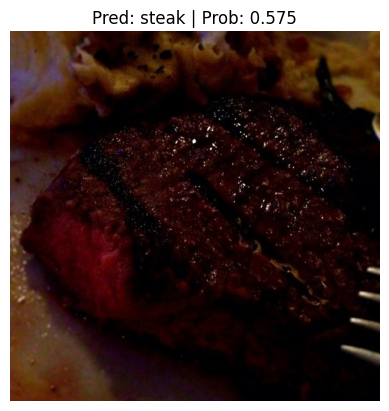

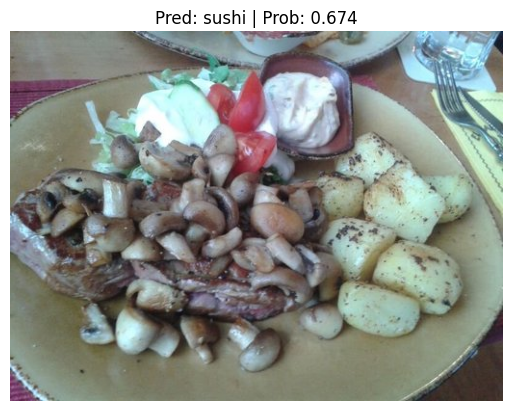

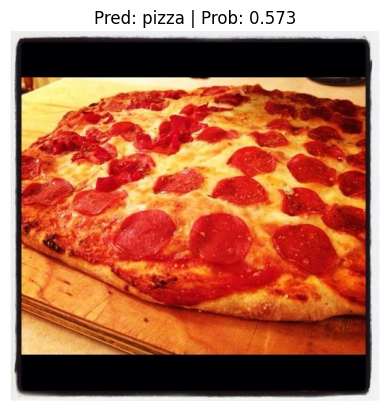

In [47]:
# Import a function to make predicitions on images and plot them.
from going_modular.going_modular.predictions import pred_and_plot_image

# Get a random list of 3 image path names from the test dataset
import random
num_images = 3
test_image_path_list = list(Path(data_20_percent_path / "test").glob("*/*.jpg"))
test_image_path_sample = random.sample(test_image_path_list,
                                       k = num_images)
for image_path in test_image_path_sample:
    pred_and_plot_image(model=best_model,
                        image_path = image_path,
                        class_names=class_names,
                        image_size=(224, 224))

### 9.1 Predict on a custom image with the best model

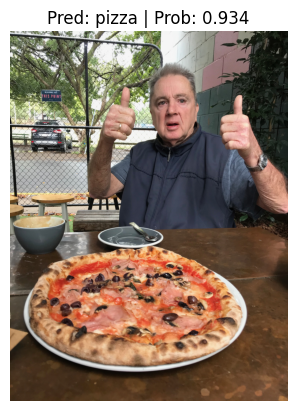

In [48]:
custom_image_path = "/content/04-pizza-dad.jpeg"
pred_and_plot_image(model=best_model,
                    image_path = custom_image_path,
                    class_names=class_names,
                    image_size=(224, 224))